In [2]:
%pylab inline
import numpy as np
import scipy.ndimage as ndi

Populating the interactive namespace from numpy and matplotlib


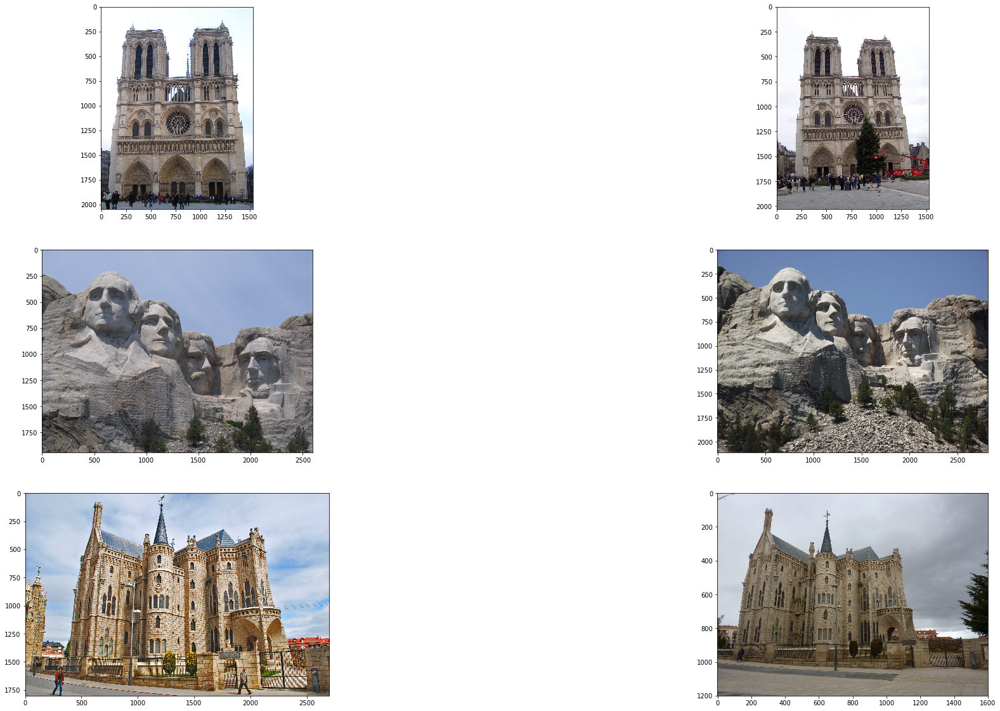

In [3]:
NotreDame = {
    'Im1': imread('data/Notre Dame/1_o.jpg'),
    'Im2': imread('data/Notre Dame/2_o.jpg')
}

MountRushmore = {
    'Im1': imread('data/Mount Rushmore/9021235130_7c2acd9554_o.jpg'),
    'Im2': imread('data/Mount Rushmore/9318872612_a255c874fb_o.jpg')
}

EpiscopalGaudi = {
    'Im1': imread('data/Episcopal Gaudi/3743214471_1b5bbfda98_o.jpg'),
    'Im2': imread('data/Episcopal Gaudi/4386465943_8cf9776378_o.jpg')
}

plt = figure(figsize=(35, 20))
nd_ax1 = plt.add_subplot(3, 2, 1)
nd_ax2 = plt.add_subplot(3, 2, 2)
nd_ax1.imshow(NotreDame['Im1'])
nd_ax2.imshow(NotreDame['Im2'])
mr_ax1 = plt.add_subplot(3, 2, 3)
mr_ax2 = plt.add_subplot(3, 2, 4)
mr_ax1.imshow(MountRushmore['Im1'])
mr_ax2.imshow(MountRushmore['Im2'])
eg_ax1 = plt.add_subplot(3, 2, 5)
eg_ax2 = plt.add_subplot(3, 2, 6)
eg_ax1.imshow(EpiscopalGaudi['Im1'])
eg_ax2.imshow(EpiscopalGaudi['Im2'])

In [13]:
def Grayscale(Image):
    if Image.ndim == 2:
        return Image
    
    GSImage = np.sum(Image, axis=2)
    GSImage /= Image.shape[2]
    return GSImage

def GaussianDerivative(sx, sy, edgeMode='reflect'):
    def Calculate(Image):
        if Image.ndim == 3:
            Image = Grayscale(Image)

        Yderivative = ndi.gaussian_filter1d(Image, sy, 0, 1, mode=edgeMode)
        Xderivative = ndi.gaussian_filter1d(Image, sx, 1, 1, mode=edgeMode)

        return Yderivative, Xderivative
    
    return Calculate

def DifferenceDerivative(sx, sy, edgeMode='reflect'):
    def Calculate(Image):
        if Image.ndim == 3:
            Image = Grayscale(Image)
            
        KernX = np.zeros(sx)
        KernX[0] = -1
        KernX[-1] = 1
        KernY = np.zeros(sy)
        KernY[0] = -1
        KernY[-1] = 1
        
        Yderivative = ndi.convolve1d(Image, KernY, 0, mode=edgeMode)
        Xderivative = ndi.convolve1d(Image, KernX, 1, mode=edgeMode)
        
        return Yderivative, Xderivative
    
    return Calculate

In [90]:
def HarrisCornersResponse(Image, DerivativeFn, WindowSize = 3, DenoiseSigma = None, EdgeMode='reflect'):
    Image = Grayscale(Image)
    Iy, Ix = DerivativeFn(Image.astype(np.float) / 255.0)
    alpha = 0.04
    
    IxIx = Ix * Ix
    IxIy = Ix * Iy
    IyIy = Iy * Iy
    
    fig = figure(figsize=(35, 20))
    ax1, ax2, ax3 = fig.subplots(1, 3)
    ax1.imshow(IxIx)
    ax2.imshow(IxIy)
    ax3.imshow(IyIy)
    
    IxIxC = ndi.convolve(IxIx, np.ones((WindowSize, WindowSize)), mode=EdgeMode)
    IxIyC = ndi.convolve(IxIy, np.ones((WindowSize, WindowSize)), mode=EdgeMode)
    IyIyC = ndi.convolve(IyIy, np.ones((WindowSize, WindowSize)), mode=EdgeMode)
    
    if DenoiseSigma:
        IxIxC = ndi.gaussian_filter(IxIxC, DenoiseSigma, mode=EdgeMode)
        IxIyC = ndi.gaussian_filter(IxIyC, DenoiseSigma, mode=EdgeMode)
        IyIyC = ndi.gaussian_filter(IyIyC, DenoiseSigma, mode=EdgeMode)
    
    fig2 = figure(figsize=(35, 20))
    ax21, ax22, ax23 = fig2.subplots(1, 3)
    ax21.imshow(IxIxC)
    ax22.imshow(IxIyC)
    ax23.imshow(IyIyC)
    
    HarrisScore = np.copy(IxIxC)
    HarrisScore *= IyIyC
    HarrisScore -= (IxIyC * IxIyC)
    HarrisScore = np.absolute(HarrisScore)    
    
    fig3 = figure(figsize=(35, 20))
    ax33 = fig3.subplots(1, 1)
    ax33.imshow(HarrisScore)
    
    return HarrisScore

def HarrisCornersLocalMaximaPoints(HarrisScore, WindowSize = 3, Threshold = 0.99, EdgeMode='reflect'):
    MaximumFiltered = ndi.maximum_filter(HarrisScore, (WindowSize, WindowSize), mode=EdgeMode)
    MinimumFiltered = ndi.minimum_filter(HarrisScore, (WindowSize, WindowSize), mode=EdgeMode)
    
    fig = figure(figsize=(35, 20))
    ax1 = fig.subplots(1, 1)
    
    Vals = MaximumFiltered - MinimumFiltered
    ValsMax = np.amax(Vals)
    ValsMin = np.amin(Vals)
    
    ax1.imshow(Vals)
        
    return np.argwhere(Vals > Vals.max() * Threshold)

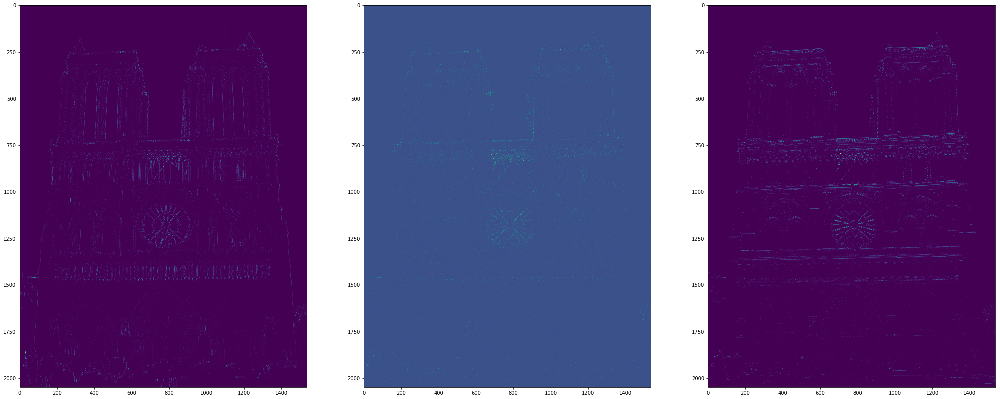

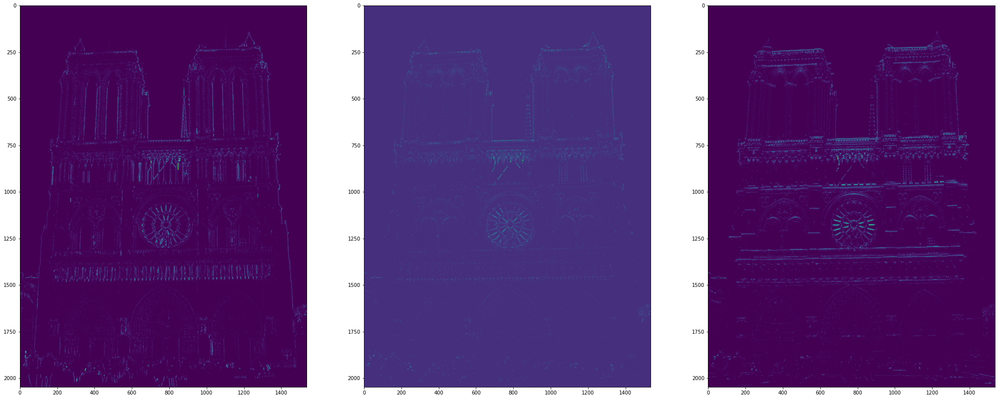

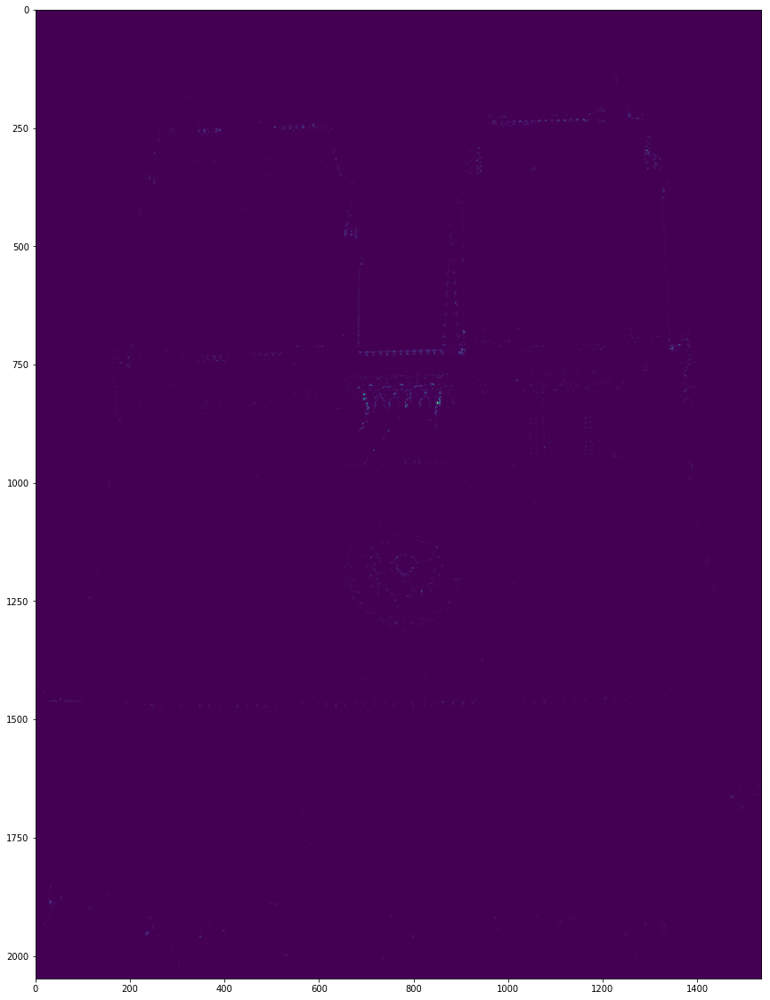

In [94]:
CornerResponse = HarrisCornersResponse(NotreDame['Im1'], GaussianDerivative(1, 1), 3)

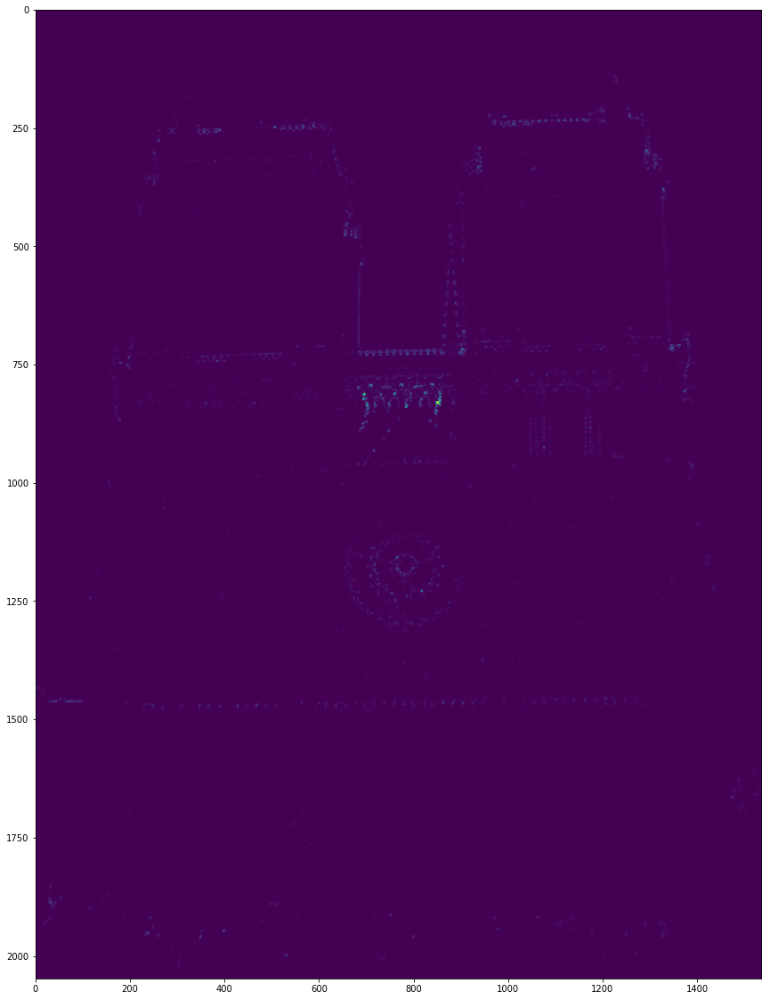

In [96]:
CornerPts = HarrisCornersLocalMaximaPoints(CornerResponse, 3, 0.1)

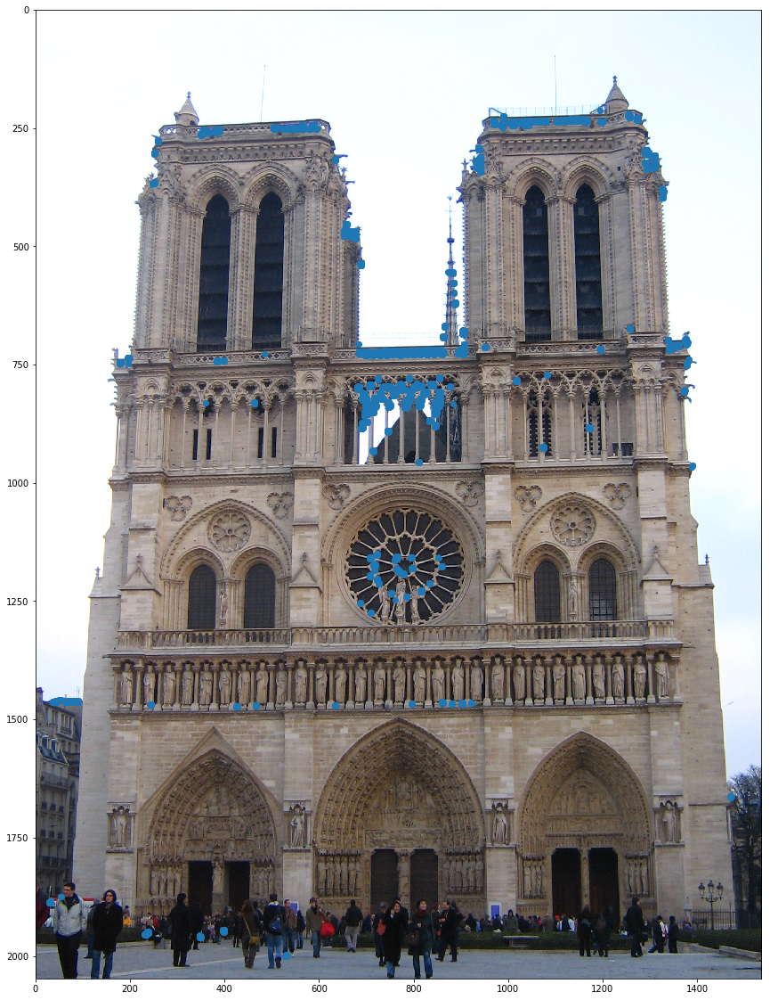

In [109]:
fig = figure(figsize=(35, 20))
ax = fig.subplots(1, 1)

ax.imshow(NotreDame['Im1'])
ax.scatter(CornerPts[:, 1], CornerPts[:, 0])

In [121]:
def HarrisCornersAdaptiveNonmaximalSuppression(HarrisResponse, CornerPts, Num):
    Radiuses = []
    Responses = HarrisResponse[CornerPts[:, 0], CornerPts[:, 1]]
    ResponseMax = np.amax(HarrisResponse)
    
    for (i, (y, x)) in enumerate(CornerPts):
        BiggerNeighIndexes = np.nonzero(Responses > Responses[i])
        BiggerNeighs = CornerPts[BiggerNeighIndexes]
        
        if BiggerNeighs.shape[0] == 0:
            Radius = 1000000000
        else:
            BiggerNeighs -= np.array([y, x])
            Radius = BiggerNeighs ** 2
            Radius = np.sum(Radius, 1)
            Radius = np.amin(Radius)
        Radiuses.append(Radius)
    
    Num = min(len(Radiuses), Num)
    Partitions = np.argpartition(-np.asarray(Radiuses), Num)[:Num]
    return CornerPts[Partitions]

ANMSCornerPts = HarrisCornersAdaptiveNonmaximalSuppression(CornerResponse, CornerPts, 100)

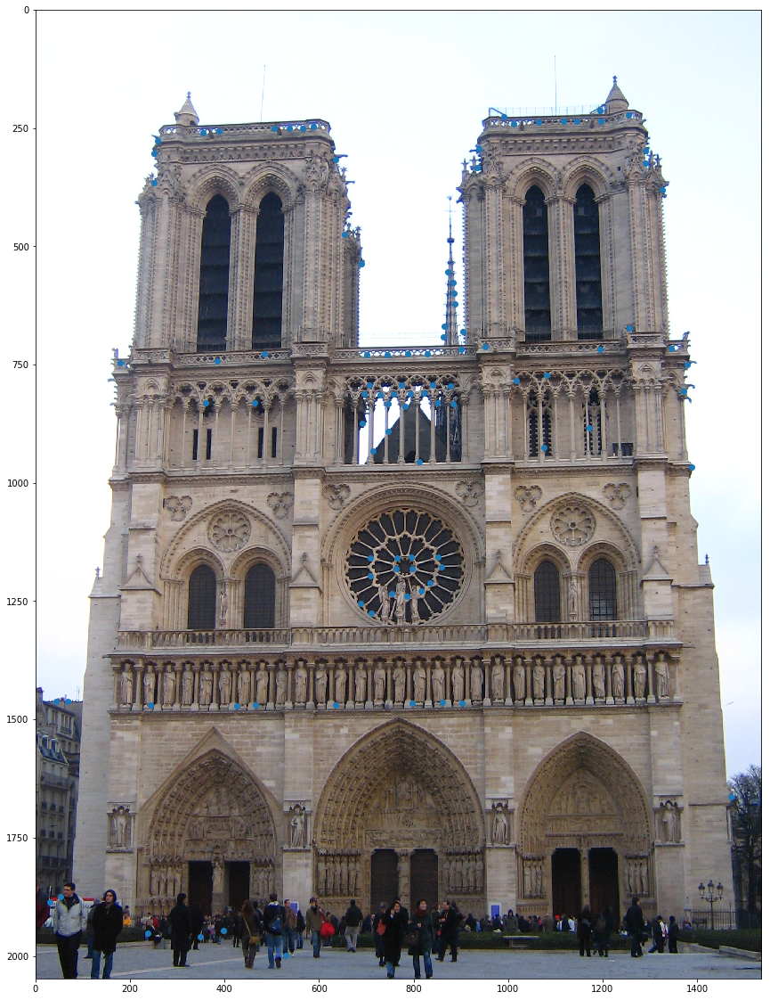

In [122]:
fig = figure(figsize=(35, 20))
ax = fig.subplots(1, 1)

ax.imshow(NotreDame['Im1'])
ax.scatter(ANMSCornerPts[:, 1], ANMSCornerPts[:, 0])

array([[0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
        2.83136675e-10, 2.71318301e-10, 4.06623822e-10],
       [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
        2.66853542e-10, 1.64240192e-10, 2.62577052e-10],
       [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
        1.12717767e-10, 2.47257458e-10, 4.82272825e-10],
       ...,
       [5.81717120e-10, 1.92648867e-09, 2.06699580e-09, ...,
        1.13747221e-08, 5.17538760e-09, 1.91341919e-09],
       [2.83618184e-10, 1.04331725e-09, 2.39663989e-09, ...,
        8.91013186e-09, 3.37240316e-09, 1.60441774e-09],
       [1.51278923e-10, 4.90104767e-10, 1.24779731e-09, ...,
        9.93726439e-09, 4.28189185e-09, 1.96887684e-09]])

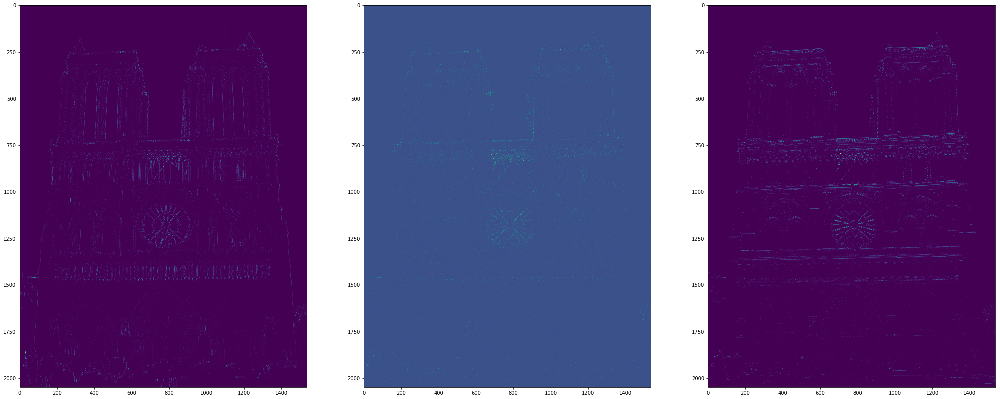

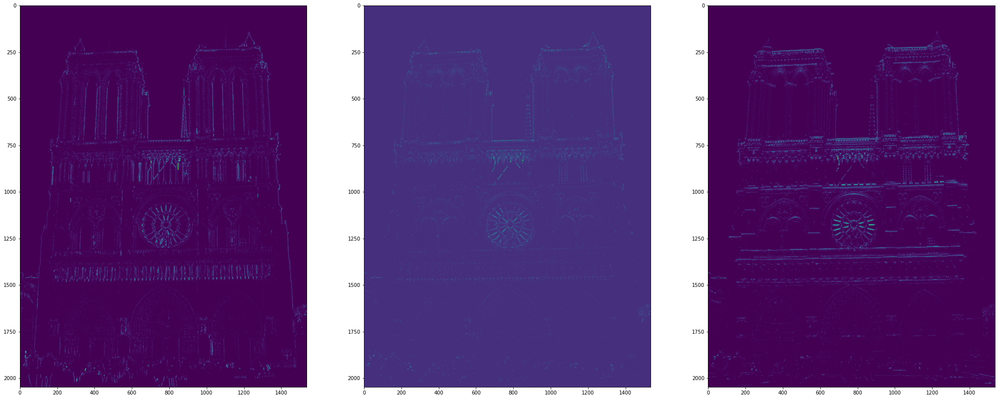

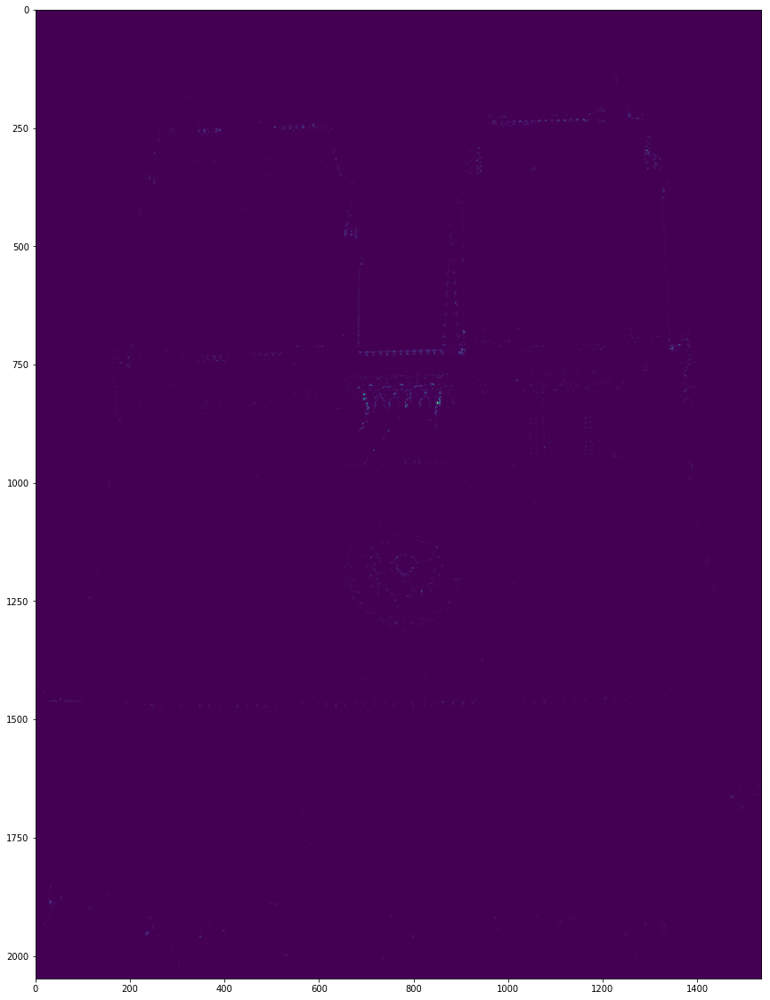

In [125]:
def ScaleInvariantHarrisCornersResponse(Image, DerivativeFn, WindowSize = 3, DenoiseSigma = None, EdgeMode='reflect'):
    SigmaBegin = 1.5
    SigmaStep = 1.2
    SigmaN = 13
    SigmaRange = np.power(SigmaStep, np.arange(SigmaN)) * SigmaBegin
    
    
HarrisCornersResponse(NotreDame['Im1'], GaussianDerivative(1, 1), 3)
    